In [190]:
pip install tensorflow==2.1

In [191]:
import pandas as pd
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

tf.__version__

'2.1.0'

In [0]:
df = pd.read_csv('/content/Weather_data.csv')

df['datetime_utc'] = pd.to_datetime(df['datetime_utc'])

In [193]:
df

,datetime_utc,_conds,_dewptm,_fog,_hail,_heatindexm,_hum,_precipm,_pressurem,_rain,_snow,_tempm,_thunder,_tornado,_vism,_wdird,_wdire,_wgustm,_windchillm,_wspdm
0,1996-11-01 11:00:00,Smoke,9.0,0,0,NaN,27.0,NaN,1010.0,0,0,30.0,0,0,5.0,280.0,West,NaN,NaN,7.4
1,1996-11-01 12:00:00,Smoke,10.0,0,0,NaN,32.0,NaN,-9999.0,0,0,28.0,0,0,NaN,0.0,North,NaN,NaN,NaN
2,1996-11-01 13:00:00,Smoke,11.0,0,0,NaN,44.0,NaN,-9999.0,0,0,24.0,0,0,NaN,0.0,North,NaN,NaN,NaN
3,1996-11-01 14:00:00,Smoke,10.0,0,0,NaN,41.0,NaN,1010.0,0,0,24.0,0,0,2.0,0.0,North,NaN,NaN,NaN
4,1996-11-01 16:00:00,Smoke,11.0,0,0,NaN,47.0,NaN,1011.0,0,0,23.0,0,0,1.2,0.0,North,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98908,2016-11-30 12:30:00,Mist,17.0,0,0,NaN,78.0,NaN,1015.0,0,0,21.0,0,0,1.5,0.0,North,NaN,NaN,0.0
98909,2016-11-30 13:00:00,Mist,16.0,0,0,NaN,83.0,NaN,1015.0,0,0,19.0,0,0,1.2,0.0,North,NaN,NaN,0.0
98910,2016-11-30 15:00:00,Patches of Fog,16.0,1,0,NaN,90.0,NaN,1016.0,0,0,17.0,0,0,1.0,NaN,NaN,NaN,NaN,0.0
98911,2016-11-30 18:00:00,Patches of Fog,14.0,1,0,NaN,96.0,NaN,1017.0,0,0,15.0,0,0,1.0,NaN,NaN,NaN,NaN,0.0


In [194]:
df.isnull().sum()

datetime_utc        0
 _conds            68
 _dewptm          619
 _fog               0
 _hail              0
 _heatindexm    69802
 _hum             753
 _precipm       98913
 _pressurem       231
 _rain              0
 _snow              0
 _tempm           669
 _thunder           0
 _tornado           0
 _vism           4416
 _wdird         14380
 _wdire         14380
 _wgustm        97850
 _windchillm    98340
 _wspdm          2353
dtype: int64

In [0]:
def check_unique(df):
  for i in range(len(df.columns)):
    name = df.columns[i]
    print(i+1,name)
    print(df[name].unique())
    print('--'*40)


In [196]:
check_unique(df)
#conds has many cateogorical value check that 

1 datetime_utc
['1996-11-01T11:00:00.000000000' '1996-11-01T12:00:00.000000000'
 '1996-11-01T13:00:00.000000000' ... '2016-11-30T15:00:00.000000000'
 '2016-11-30T18:00:00.000000000' '2016-11-30T21:00:00.000000000']
--------------------------------------------------------------------------------
2  _conds
['Smoke' 'Clear' 'Haze' 'Unknown' 'Scattered Clouds' 'Shallow Fog'
 'Mostly Cloudy' 'Fog' 'Partly Cloudy' 'Patches of Fog'
 'Thunderstorms and Rain' 'Overcast' 'Rain' 'Light Rain' 'Light Drizzle'
 'Drizzle' 'Mist' 'Volcanic Ash' 'Thunderstorm'
 'Light Thunderstorms and Rain' 'Light Thunderstorm' 'Squalls'
 'Heavy Rain' 'Light Haze' 'Sandstorm' 'Widespread Dust' 'Funnel Cloud'
 'Heavy Thunderstorms and Rain' 'Heavy Thunderstorms with Hail'
 'Light Rain Showers' 'Thunderstorms with Hail' nan 'Partial Fog'
 'Light Fog' 'Heavy Fog' 'Blowing Sand' 'Light Hail Showers'
 'Light Sandstorm' 'Light Freezing Rain' 'Rain Showers']
-------------------------------------------------------------------

In [197]:
df[' _conds'].unique()
df[' _conds'].nunique() #we have 39 unique values

39

In [0]:
def check_nounique(df):
  for i in range(len(df.columns)):
    name = df.columns[i]
    print(i+1,name)
    print(df[name].nunique())
    print('--'*20)


In [199]:
check_nounique(df)

1 datetime_utc
98913
----------------------------------------
2  _conds
39
----------------------------------------
3  _dewptm
51
----------------------------------------
4  _fog
2
----------------------------------------
5  _hail
2
----------------------------------------
6  _heatindexm
193
----------------------------------------
7  _hum
100
----------------------------------------
8  _precipm
0
----------------------------------------
9  _pressurem
139
----------------------------------------
10  _rain
2
----------------------------------------
11  _snow
2
----------------------------------------
12  _tempm
50
----------------------------------------
13  _thunder
2
----------------------------------------
14  _tornado
2
----------------------------------------
15  _vism
48
----------------------------------------
16  _wdird
63
----------------------------------------
17  _wdire
17
----------------------------------------
18  _wgustm
22
----------------------------------------
19  _w

In [200]:
df.isnull().sum()

datetime_utc        0
 _conds            68
 _dewptm          619
 _fog               0
 _hail              0
 _heatindexm    69802
 _hum             753
 _precipm       98913
 _pressurem       231
 _rain              0
 _snow              0
 _tempm           669
 _thunder           0
 _tornado           0
 _vism           4416
 _wdird         14380
 _wdire         14380
 _wgustm        97850
 _windchillm    98340
 _wspdm          2353
dtype: int64

In [0]:
df.set_index('datetime_utc',inplace=True )

In [202]:
df

,_conds,_dewptm,_fog,_hail,_heatindexm,_hum,_precipm,_pressurem,_rain,_snow,_tempm,_thunder,_tornado,_vism,_wdird,_wdire,_wgustm,_windchillm,_wspdm
datetime_utc,,,,,,,,,,,,,,,,,,,
1996-11-01 11:00:00,Smoke,9.0,0,0,NaN,27.0,NaN,1010.0,0,0,30.0,0,0,5.0,280.0,West,NaN,NaN,7.4
1996-11-01 12:00:00,Smoke,10.0,0,0,NaN,32.0,NaN,-9999.0,0,0,28.0,0,0,NaN,0.0,North,NaN,NaN,NaN
1996-11-01 13:00:00,Smoke,11.0,0,0,NaN,44.0,NaN,-9999.0,0,0,24.0,0,0,NaN,0.0,North,NaN,NaN,NaN
1996-11-01 14:00:00,Smoke,10.0,0,0,NaN,41.0,NaN,1010.0,0,0,24.0,0,0,2.0,0.0,North,NaN,NaN,NaN
1996-11-01 16:00:00,Smoke,11.0,0,0,NaN,47.0,NaN,1011.0,0,0,23.0,0,0,1.2,0.0,North,NaN,NaN,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-11-30 12:30:00,Mist,17.0,0,0,NaN,78.0,NaN,1015.0,0,0,21.0,0,0,1.5,0.0,North,NaN,NaN,0.0
2016-11-30 13:00:00,Mist,16.0,0,0,NaN,83.0,NaN,1015.0,0,0,19.0,0,0,1.2,0.0,North,NaN,NaN,0.0
2016-11-30 15:00:00,Patches of Fog,16.0,1,0,NaN,90.0,NaN,1016.0,0,0,17.0,0,0,1.0,NaN,NaN,NaN,NaN,0.0


In [203]:
d =df.columns[6]  #removig mostly null value column
df.drop(columns=d,inplace=True)
df.head(n=5)

,_conds,_dewptm,_fog,_hail,_heatindexm,_hum,_pressurem,_rain,_snow,_tempm,_thunder,_tornado,_vism,_wdird,_wdire,_wgustm,_windchillm,_wspdm
datetime_utc,,,,,,,,,,,,,,,,,,
1996-11-01 11:00:00,Smoke,9.0,0,0,NaN,27.0,1010.0,0,0,30.0,0,0,5.0,280.0,West,NaN,NaN,7.4
1996-11-01 12:00:00,Smoke,10.0,0,0,NaN,32.0,-9999.0,0,0,28.0,0,0,NaN,0.0,North,NaN,NaN,NaN
1996-11-01 13:00:00,Smoke,11.0,0,0,NaN,44.0,-9999.0,0,0,24.0,0,0,NaN,0.0,North,NaN,NaN,NaN
1996-11-01 14:00:00,Smoke,10.0,0,0,NaN,41.0,1010.0,0,0,24.0,0,0,2.0,0.0,North,NaN,NaN,NaN
1996-11-01 16:00:00,Smoke,11.0,0,0,NaN,47.0,1011.0,0,0,23.0,0,0,1.2,0.0,North,NaN,NaN,0.0


In [204]:
for i in range(len(df.columns)):
  name = df.columns[i]
  print(i+1, name)
  print(df[name].value_counts())
  print('='*50)

1  _conds
Haze                             46887
Smoke                            20334
Mist                              8999
Clear                             3129
Widespread Dust                   2830
Fog                               2541
Scattered Clouds                  2197
Partly Cloudy                     2064
Shallow Fog                       1859
Mostly Cloudy                     1520
Light Rain                        1297
Partial Fog                        962
Patches of Fog                     816
Thunderstorms and Rain             471
Light Drizzle                      410
Heavy Fog                          407
Rain                               394
Unknown                            378
Blowing Sand                       358
Overcast                           313
Thunderstorm                       190
Light Thunderstorms and Rain       170
Drizzle                            111
Light Thunderstorm                  63
Light Fog                           52
Heavy Rain     

In [0]:
condition = df[' _conds'].value_counts()

top10 = condition[:10]

In [0]:
import seaborn as sns
import plotly.express as px

In [207]:
fig  = px.bar(top10, x=top10.index, y =top10, )
fig.show()

In [208]:
df[df[' _conds'].isnull()].head(n=50)

,_conds,_dewptm,_fog,_hail,_heatindexm,_hum,_pressurem,_rain,_snow,_tempm,_thunder,_tornado,_vism,_wdird,_wdire,_wgustm,_windchillm,_wspdm
datetime_utc,,,,,,,,,,,,,,,,,,
2004-07-19 03:00:00,NaN,22.0,0,0,NaN,49.0,997.0,0,0,31.0,0,0,4.00,270.0,West,NaN,NaN,14.8
2005-01-03 09:00:00,NaN,13.0,0,0,NaN,NaN,1017.0,0,0,NaN,0,0,0.60,10.0,North,NaN,NaN,129.6
2005-03-12 15:00:00,NaN,14.0,0,0,NaN,NaN,1014.0,0,0,NaN,0,0,0.40,20.0,NNE,NaN,NaN,51.9
2005-04-08 12:00:00,NaN,1.0,0,0,NaN,6.0,1004.0,0,0,33.0,0,0,1.00,180.0,South,NaN,NaN,5.6
2005-04-27 06:00:00,NaN,12.0,0,0,NaN,16.0,1005.0,0,0,35.0,0,0,4.00,270.0,West,NaN,NaN,1.9
2005-06-02 06:00:00,NaN,12.0,0,0,NaN,12.0,999.0,0,0,39.0,0,0,2.00,290.0,WNW,NaN,NaN,11.1
2005-12-25 00:00:00,NaN,8.0,0,0,NaN,NaN,1018.0,0,0,NaN,0,0,0.40,NaN,NaN,NaN,NaN,155.6
2005-12-25 09:00:00,NaN,4.0,0,0,NaN,NaN,1016.0,0,0,NaN,0,0,1.10,20.0,NNE,NaN,NaN,0.0
2006-01-28 21:00:00,NaN,8.0,0,0,NaN,88.0,1018.0,0,0,9.0,0,0,0.50,NaN,NaN,NaN,NaN,0.0


In [209]:
df.resample('D').mean().head(n=50)

,_dewptm,_fog,_hail,_heatindexm,_hum,_pressurem,_rain,_snow,_tempm,_thunder,_tornado,_vism,_wdird,_wgustm,_windchillm,_wspdm
datetime_utc,,,,,,,,,,,,,,,,
1996-11-01,11.666667,0.000000,0.0,NaN,52.916667,-2659.666667,0.0,0.0,22.333333,0.0,0.0,2.250000,23.333333,NaN,NaN,2.466667
1996-11-02,10.458333,0.000000,0.0,NaN,48.625000,1009.833333,0.0,0.0,22.916667,0.0,0.0,3.476190,106.666667,NaN,NaN,8.028571
1996-11-03,12.041667,0.000000,0.0,26.80,55.958333,1010.500000,0.0,0.0,21.791667,0.0,0.0,2.286364,106.666667,NaN,NaN,4.804545
1996-11-04,10.222222,0.000000,0.0,27.50,48.055556,1011.333333,0.0,0.0,22.722222,0.0,0.0,2.326667,55.555556,NaN,NaN,1.964706
1996-11-05,8.200000,0.000000,0.0,NaN,29.400000,1011.800000,0.0,0.0,27.800000,0.0,0.0,3.900000,208.000000,NaN,NaN,10.020000
1996-11-06,9.062500,0.000000,0.0,NaN,47.875000,1011.812500,0.0,0.0,21.937500,0.0,0.0,3.290909,94.375000,NaN,NaN,6.072727
1996-11-07,9.458333,0.000000,0.0,NaN,48.000000,1013.416667,0.0,0.0,21.750000,0.0,0.0,2.734783,117.916667,NaN,NaN,3.395652
1996-11-08,8.130435,0.000000,0.0,NaN,45.217391,1014.708333,0.0,0.0,21.260870,0.0,0.0,2.709091,87.083333,NaN,NaN,2.325000
1996-11-09,7.772727,0.000000,0.0,NaN,47.181818,1013.863636,0.0,0.0,19.909091,0.0,0.0,2.868421,117.272727,NaN,NaN,4.978947


In [210]:
df.isnull().sum() #now we ahandling data

 _conds            68
 _dewptm          619
 _fog               0
 _hail              0
 _heatindexm    69802
 _hum             753
 _pressurem       231
 _rain              0
 _snow              0
 _tempm           669
 _thunder           0
 _tornado           0
 _vism           4416
 _wdird         14380
 _wdire         14380
 _wgustm        97850
 _windchillm    98340
 _wspdm          2353
dtype: int64

In [211]:
px.line( df, x=df.index, y = df[' _dewptm']  ,      )

In [0]:
d = df.corr()

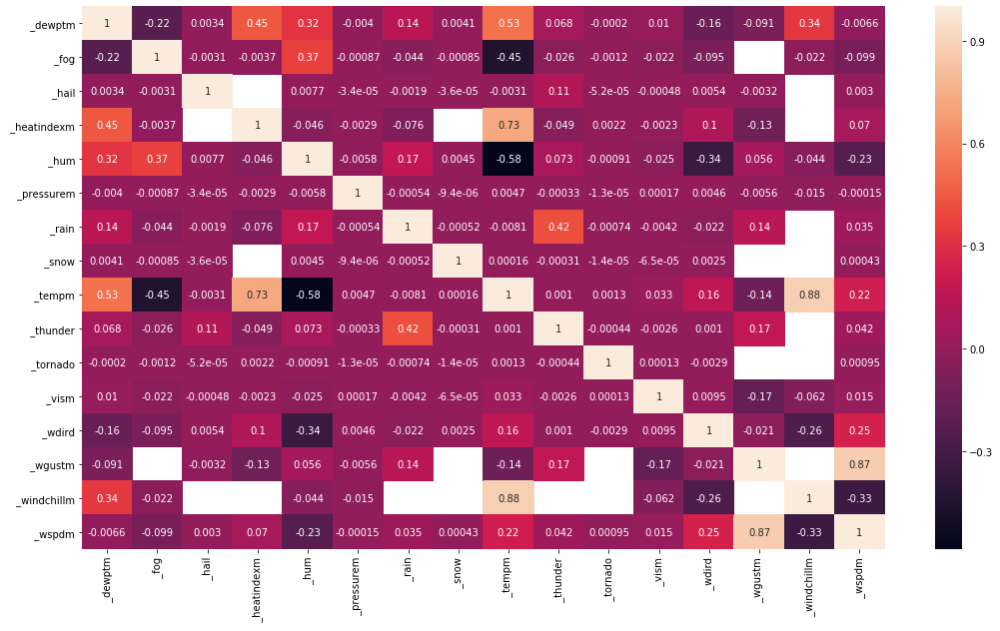

In [213]:
plt.figure(figsize=(18,10))
sns.heatmap(d, annot=True)
plt.show()

In [0]:
#windchilm,hum, heatindx, fog, dewpoint, cond

In [215]:
len(df[' _conds'].value_counts())
df.columns

Index([' _conds', ' _dewptm', ' _fog', ' _hail', ' _heatindexm', ' _hum',
       ' _pressurem', ' _rain', ' _snow', ' _tempm', ' _thunder', ' _tornado',
       ' _vism', ' _wdird', ' _wdire', ' _wgustm', ' _windchillm', ' _wspdm'],
      dtype='object')

In [0]:
df1 = df.drop(columns=[' _conds', ' _wspdm', ' _wdird', ' _vism', ' _pressurem', ' _wdire',' _wgustm' ])

In [217]:
df1.isnull().sum()

 _dewptm          619
 _fog               0
 _hail              0
 _heatindexm    69802
 _hum             753
 _rain              0
 _snow              0
 _tempm           669
 _thunder           0
 _tornado           0
 _windchillm    98340
dtype: int64

In [218]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

fig = make_subplots(rows=3, cols=1,   subplot_titles=("dewptm","humidity", "temprature"))



fig.append_trace(go.Scatter(
    x=df1.index,
    y= df1[' _dewptm'],
     text = '_dewptm'
), row=1, col=1)

fig.append_trace(go.Scatter(
    x=df1.index,
    y=df1[' _hum'],
    text = ' _hum'
), row=2, col=1)

fig.append_trace(go.Scatter(
    x=df1.index,
    y=df1[' _tempm'],
    text = ' _tempm'
), row=3, col=1)


fig.update_layout(height=1200, width=800, title_text="weather plot")
fig.show()

In [0]:
#there are some  error in temp. reading 

In [0]:
df1.isnull().sum() #we need to remove heatindexm because of lots of null value and windchillm
df1.drop(columns=[' _heatindexm', ' _windchillm' ], inplace=True)

In [0]:
df1.fillna(value='Nan', inplace=True)

In [0]:
def filling_na(df):
  time = 24 # we are changing value with past same time
  for row in range(df.shape[0]):
    for col in range(df.shape[1]):
      if df.iloc[row,col]=='Nan':
        df.iloc[row, col] = df.iloc[row-time, col]




filling_na(df1)

In [223]:
df1.describe()

,_dewptm,_fog,_hail,_hum,_rain,_snow,_tempm,_thunder,_tornado
count,98913.000000,98913.000000,98913.000000,98913.000000,98913.000000,98913.00000,98913.000000,98913.000000,98913.000000
mean,15.812037,0.067109,0.000131,57.814645,0.026498,0.00001,25.566174,0.009362,0.000020
std,7.100394,0.250213,0.011464,23.755666,0.160612,0.00318,8.469054,0.096303,0.004497
min,-24.000000,0.000000,0.000000,4.000000,0.000000,0.00000,1.000000,0.000000,0.000000
25%,10.000000,0.000000,0.000000,39.000000,0.000000,0.00000,19.000000,0.000000,0.000000
50%,15.000000,0.000000,0.000000,58.000000,0.000000,0.00000,27.000000,0.000000,0.000000
75%,22.000000,0.000000,0.000000,77.000000,0.000000,0.00000,32.000000,0.000000,0.000000
max,75.000000,1.000000,1.000000,243.000000,1.000000,1.00000,90.000000,1.000000,1.000000


In [0]:
data = df1.resample('D').mean()


In [225]:
data_train = data.loc[:'2015-12-31', :][' _tempm']
data_train
data_train = np.array(data_train)
data_train.shape

(7000,)

In [226]:
data_test = data['2016'][' _tempm']
data_test

datetime_utc
2016-01-01    14.714286
2016-01-02    14.000000
2016-01-03    14.375000
2016-01-04    15.750000
2016-01-05    15.833333
                ...    
2016-11-26    24.294118
2016-11-27    23.636364
2016-11-28    22.454545
2016-11-29    21.611111
2016-11-30    19.869565
Freq: D, Name:  _tempm, Length: 335, dtype: float64

In [0]:
x_train, y_train = [], []

for i in range(7, len(data_train)-7):
    x_train.append(data_train[i-7:i])
    y_train.append(data_train[i:i+7])


In [0]:
x_train = pd.DataFrame(x_train)
y_train = pd.DataFrame(y_train)


In [0]:
from sklearn.preprocessing import MinMaxScaler

In [263]:
sc_x = MinMaxScaler()
x_train =sc_x.fit_transform(x_train)
x_train.shape

(6986, 7)

In [0]:
sc_y = MinMaxScaler()
y_train = sc_y.fit_transform(y_train)

In [271]:
pd.DataFrame(y_train).isnull().sum()

0    141
1    141
2    141
3    141
4    141
5    141
6    141
dtype: int64

In [0]:
x_train = x_train.reshape(6986, 7,1)
pd.DataFrame

In [0]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

In [0]:
model = Sequential()
model.add(LSTM(units = 200, activation = 'relu', input_shape=(7,1)))
model.add(Dense(128, activation='relu'))
model.add(Dense(7))

In [269]:
model.compile(loss='mse', optimizer='adam')
model.fit(x_train,y_train,epochs=100)

Train on 6986 samples
Epoch 1/100
6986/6986 [==============================] - 5s 737us/sample - loss: nan
Epoch 2/100
6986/6986 [==============================] - 4s 613us/sample - loss: nan
Epoch 3/100
6986/6986 [==============================] - 4s 633us/sample - loss: nan
Epoch 4/100
6986/6986 [==============================] - 4s 602us/sample - loss: nan
Epoch 5/100
6986/6986 [==============================] - 4s 621us/sample - loss: nan
Epoch 6/100
6986/6986 [==============================] - 4s 599us/sample - loss: nan
Epoch 7/100
6986/6986 [==============================] - 4s 587us/sample - loss: nan
Epoch 8/100
6986/6986 [==============================] - 4s 605us/sample - loss: nan
Epoch 9/100
6986/6986 [==============================] - 4s 600us/sample - loss: nan
Epoch 10/100
6986/6986 [==============================] - 4s 641us/sample - loss: nan
Epoch 11/100
6986/6986 [==============================] - 4s 631us/sample - loss: nan
Epoch 12/100
6986/6986 [=================